In [1]:
from __future__ import division
import string
import math
import nltk
import json
import unidecode
import numpy as np
import pandas as pd
import winsound
import pickle
import os
from nltk.corpus import stopwords
from scipy import stats
from text_clustering import text_preprocessing as tp
from collections import Counter
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt, mpld3
mpld3.enable_notebook()
import matplotlib.pylab as pylab
import glob, os
import gensim
from gensim import corpora
from collections import Counter

C:\Users\CATALINA ESPINOZA\AppData\Local\conda\conda\envs\env27\lib\site-packages\pydub\utils.py:165: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)
C:\Users\CATALINA ESPINOZA\AppData\Local\conda\conda\envs\env27\lib\site-packages\gensim\utils.py:1197: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")
C:\Users\CATALINA ESPINOZA\AppData\Local\conda\conda\envs\env27\lib\site-packages\scipy\sparse\sparsetools.py:20: DeprecationWarning: `scipy.sparse.sparsetools` is deprecated!
scipy.sparse.sparsetools is a private module for scipy.sparse, and should not be used.
  _deprecated()


In [ ]:
stopwords

In [2]:
import topic_preprocessing as topic_pre

In [3]:
root_path = 'C:\Users\CATALINA ESPINOZA\Documents\clusters ciae'
data_path = os.path.join(root_path,'data')
output_path = os.path.join(root_path,'output')
pickle_path = os.path.join(output_path,'pickles')
all_files_path_jose = os.path.join(data_path,'textos_jose')
all_files_path_ulloa = os.path.join(data_path,'heber')
all_files_path_patricio = os.path.join(data_path,'textos_patricio')
all_files_path_others = os.path.join(data_path,'profes_varios_min_15m')

In [4]:
num_topics_array = np.arange(30,200,40)
n_lines_by_document = [2,4,8,20]
print((num_topics_array))
print((n_lines_by_document))

[ 30  70 110 150 190]
[2, 4, 8, 20]


In [5]:
clean_texts_pairs = []
for element in grouped(clean_texts, n_lines):
    aux = []
    for x in element:
        aux += x
    clean_texts_pairs.append(aux)

NameError: name 'grouped' is not defined

In [5]:
with open('splitted_15s.pickle','rb') as f:
    all_corpus = pickle.load(f)
    clean_texts = pickle.load(f)

In [7]:
with open(os.path.join(pickle_path,'dictionary.pickle'),'rb') as f:
    dictionary = pickle.load(f)    

In [8]:
d_id2token =  dictionary.id2token

In [10]:
threshold = 0.4
ldamodels = []
n_per_topic_models = []
for num_topics in num_topics_array:
    for n_lines in n_lines_by_document:
        n_per_topic_model = []
        a_name = 'dict_topic_'+str(n_lines*15)+'s_'+str(num_topics)+'.pickle'
        with open(os.path.join('pickle_topic_models',a_name),'rb') as f:
            dict_topic = pickle.load(f)
            a_model = pickle.load(f)
        ldamodels.append(a_model)
        for i in range(num_topics):
            topic = a_model.get_topic_terms(i, topn=20)
            T = [(d_id2token[x],y) for (x,y) in topic]
            sum_belonging = 0
            count = 0
            for t in T:
                (a,b) = t
                sum_belonging += b
                if sum_belonging > threshold:
                    break
                count += 1
            n_per_topic_model.append((count,sum_belonging))
        n_per_topic_models.append(n_per_topic_model)

In [ ]:
threshold = 0.4
ldamodels = []
topic_vectors_per_model = []
for num_topics in num_topics_array:
    for n_lines in n_lines_by_document:
        topic_vectors_per_topic = []
        a_name = 'dict_topic_'+str(n_lines*15)+'s_'+str(num_topics)+'.pickle'
        with open(a_name,'rb') as f:
            dict_topic = pickle.load(f)
            a_model = pickle.load(f)
        ldamodels.append(a_model)
        for i in range(num_topics):
            topic = a_model.get_topic_terms(i, topn=500)
            T = [(d_id2token[x],y) for (x,y) in topic]
            topic_vector = []
            for t in T:
                (a,b) = t
                topic_vector.append(
                if sum_belonging > threshold:
                    break
                count += 1
            topic_vectors_per_topic.append((count,sum_belonging))
        topic_vectors_per_model.append(topic_vectors_per_topic)

In [8]:
len(n_per_topic_models)

20

In [9]:
len(n_per_topic_models[0])

30

In [34]:
n_rows*n_cols+1

21

In [11]:
def generate_plots(values_to_plot,les_titles):
    n = len(values_to_plot)
    a = 5
    b = 4
    print "a\t=\t%d\nb\t=\t%d\na*b\t=\t%d\nn\t=\t%d" % (a,b,a*b,n)
    fig = plt.figure(figsize=(3.*b,2.5*a))
    for i in range(n):
        ax = fig.add_subplot(a,b,i+1)
        ax.hist(list(map(lambda x: x[0],values_to_plot[i])),range(0,21,1))
        ax.set_title(les_titles[i])
    fig.suptitle("n = %d" % n)
    fig.set_tight_layout(True)
    return fig

In [12]:
%pylab inline
pylab.rcParams['figure.figsize'] = (12, 10)

Populating the interactive namespace from numpy and matplotlib


C:\Users\CATALINA ESPINOZA\AppData\Local\conda\conda\envs\env27\lib\site-packages\IPython\core\magics\pylab.py:161: UserWarning: pylab import has clobbered these variables: ['f']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [13]:
les_titles = []
for num_topics in num_topics_array:
    for n_lines in n_lines_by_document:
        les_titles.append('N topic = '+str(num_topics)+', Seconds = '+str(n_lines*15))

a	=	5
b	=	4
a*b	=	20
n	=	20


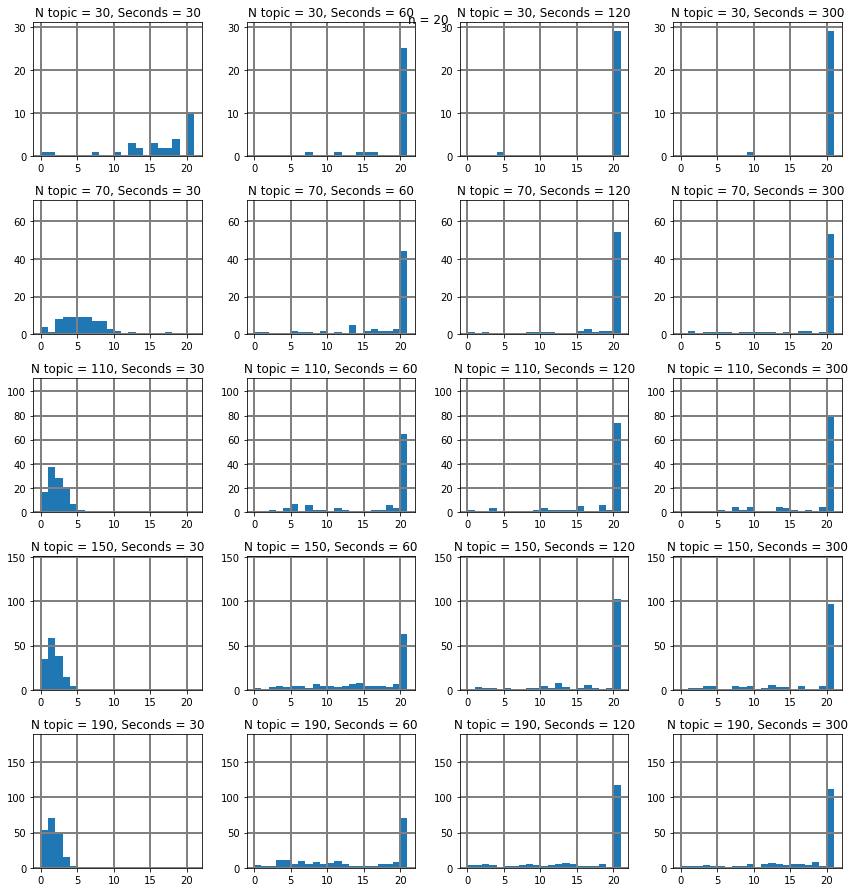

In [16]:
a = generate_plots(n_per_topic_models,les_titles)
a.show()

In [68]:
threshold = 0.4
ldamodels = []
n_per_topic_models = []
total_sums = []
for num_topics in num_topics_array:
    for n_lines in n_lines_by_document:
        n_per_topic_model = []
        total_sum = []
        a_name = 'dict_topic_'+str(n_lines*15)+'s_'+str(num_topics)+'.pickle'
        with open(a_name,'rb') as f:
            dict_topic = pickle.load(f)
            a_model = pickle.load(f)
        ldamodels.append(a_model)
        for i in range(num_topics):
            topic = a_model.get_topic_terms(i, topn=20)
            T = [(d_id2token[x],y) for (x,y) in topic]
            sum_belonging = 0
            count = 0
            total_sum_topics = 0
            for t in T:
                (a,b) = t
                total_sum_topics +=b
                if sum_belonging > threshold:
                    break
                else:
                    sum_belonging += b
                    count += 1
            n_per_topic_model.append((count,sum_belonging))
            total_sum.append(total_sum_topics)
        total_sums.append(total_sum)
        n_per_topic_models.append(n_per_topic_model)

a	=	5
b	=	4
a*b	=	20
n	=	20


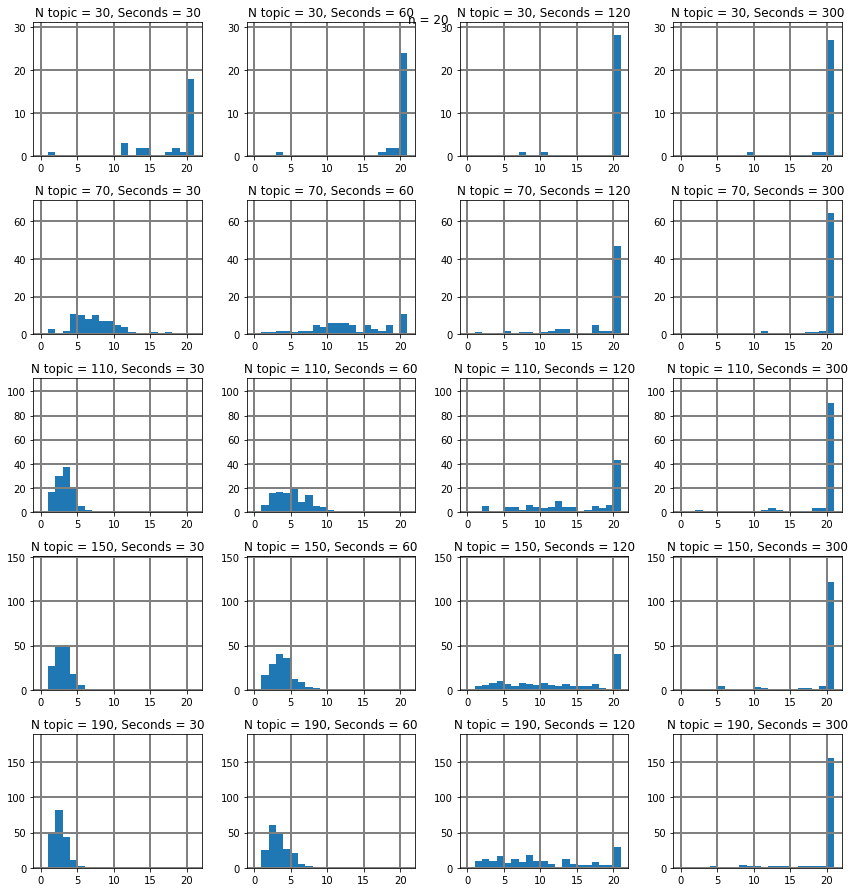

In [79]:
a = generate_plots(n_per_topic_models,les_titles)
a.show()

In [15]:
def generate_plots(values_to_plot,les_titles,argument=0):
    n = len(values_to_plot)
    a = 5
    b = 4
    print "a\t=\t%d\nb\t=\t%d\na*b\t=\t%d\nn\t=\t%d" % (a,b,a*b,n)
    fig = plt.figure(figsize=(3.*b,2.5*a))
    for i in range(n):
        ax = fig.add_subplot(a,b,i+1)
        if argument == 0:
            if i <4:
                ax.set_ylim(0,31)
            elif i<8:
                ax.set_ylim(0,71)
            elif i<12:
                ax.set_ylim(0,111)
            elif i<16:
                ax.set_ylim(0,151)
            else:
                ax.set_ylim(0,190)
            ax.hist(list(map(lambda x: x[argument],values_to_plot[i])),range(0,22,1))
        else:
            if i <4:
                ax.set_ylim(0,17)
            elif i<8:
                ax.set_ylim(0,71)
            elif i<12:
                ax.set_ylim(0,111)
            elif i<16:
                ax.set_ylim(0,151)
            else:
                ax.set_ylim(0,160)
            ax.hist(list(map(lambda x: x[argument],values_to_plot[i])),np.arange(0,1,0.1), edgecolor='lightgray',)
        ax.set_title(les_titles[i])
        ax.grid(color='gray', linestyle='-', linewidth=2)
    fig.suptitle("n = %d" % n)
    fig.set_tight_layout(True)
    return fig

In [32]:
suma_per_model = []
for i in range(len(n_per_topic_models)):
    a_model_results = n_per_topic_models[i]
    suma = 0
    for j in range(len(a_model_results)):
        suma += a_model_results[j][0]
    suma_per_model.append(suma)
print(suma_per_model)

[987, 1537, 2089, 2472, 702, 1451, 3290, 5234, 321, 688, 3390, 7090, 385, 600, 3196, 9608, 372, 600, 3120, 11681]


In [34]:
suma_per_model = []
for i in range(len(n_per_topic_models)):
    a_model_results = n_per_topic_models[i]
    suma = 0
    for j in range(len(a_model_results)):
        suma += a_model_results[j][0]
    suma_per_model.append(suma)
print(suma_per_model)

[586, 907, 1235, 2699, 408, 848, 1968, 5374, 191, 416, 2936, 5763, 229, 353, 2870, 8952, 215, 369, 1879, 21320]


a	=	5
b	=	4
a*b	=	20
n	=	20


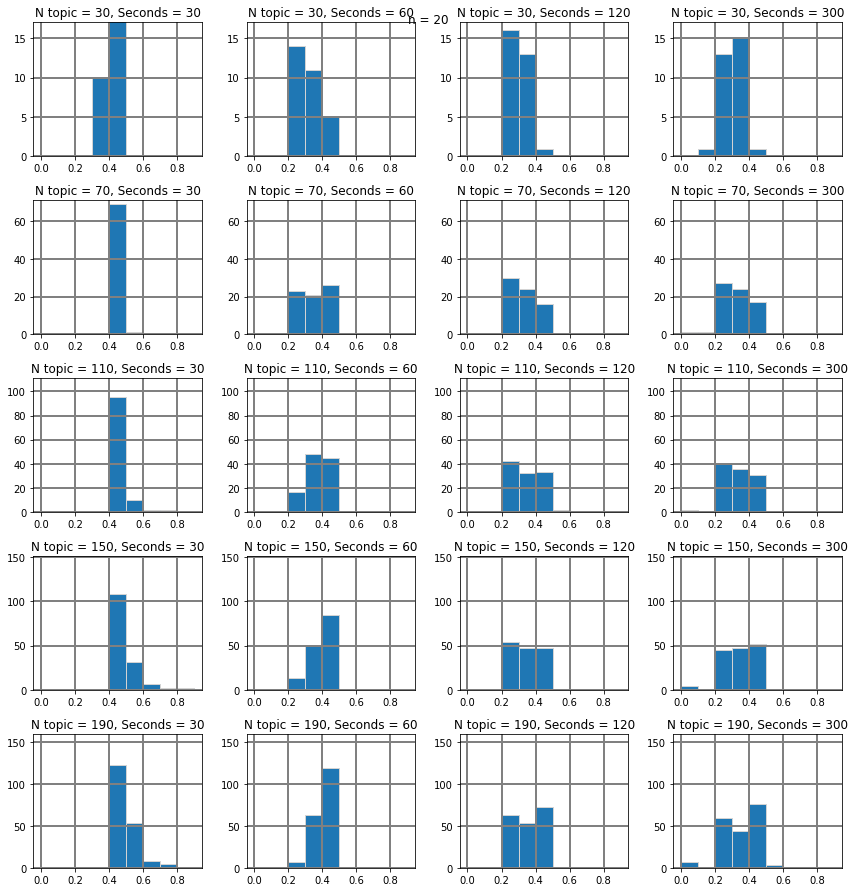

In [18]:
a = generate_plots(n_per_topic_models,les_titles,1)
a.show()

### Word analysis

In [12]:
threshold = 0.4
set_of_words = []
counter = 0
for num_topics in num_topics_array:
    for n_lines in n_lines_by_document:
        a_model = ldamodels[counter]
        set_of_word = []
        for i in range(num_topics):
            topic = a_model.get_topic_terms(i, topn=20)
            T = [(d_id2token[x],y) for (x,y) in topic]
            words = set()
            for t in T:
                (a,b) = t
                words.add(a)
            set_of_word.append(words)
        set_of_words.append(set_of_word)
        counter += 1

In [ ]:
threshold = 0.4
set_of_words = []
counter = 0
for num_topics in num_topics_array:
    for n_lines in n_lines_by_document:
        a_model = ldamodels[counter]
        set_of_word = []
        for i in range(num_topics):
            topic = a_model.get_topic_terms(i, topn=20)
            T = [(d_id2token[x],y) for (x,y) in topic]
            words = set()
            for t in T:
                (a,b) = t
                words.add(a)
            set_of_word.append(words)
        set_of_words.append(set_of_word)
        counter += 1

In [13]:
print(len(set_of_words))
print(len(set_of_words[0]))

20
30


### Diferencia simétrica

In [14]:
def get_symetric_difference(list_of_set_per_topic_per_model):
    a_list_of_matrices = []
    for a_model in list_of_set_per_topic_per_model:
        a_matrix = np.zeros((len(a_model),len(a_model)))
        for i,a_topic in enumerate(a_model):
            for j,another_topic in enumerate(a_model):
                a_matrix[i,j] = len(a_topic.symmetric_difference(another_topic))
        a_list_of_matrices.append(a_matrix)
    return a_list_of_matrices

In [15]:
def generate_heatmap_symetric_difference(values_to_plot,les_titles):
    n = len(values_to_plot)
    a = 5
    b = 4
    print "a\t=\t%d\nb\t=\t%d\na*b\t=\t%d\nn\t=\t%d" % (a,b,a*b,n)
    fig = plt.figure(figsize=(3.*b,2.5*a))
    for i in range(n):
        ax = fig.add_subplot(a,b,i+1)
        ax = sns.heatmap(values_to_plot[i], linewidth=0.5)
        ax.set_title(les_titles[i])
        ax.grid(color='gray', linestyle='-', linewidth=2)
    fig.suptitle("n = %d" % n)
    fig.set_tight_layout(True)
    return fig

In [9]:
import seaborn as sns

In [17]:
list_of_symetric_differences = get_symetric_difference(set_of_words)

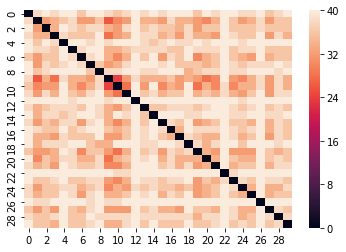

In [18]:
sns.heatmap(list_of_symetric_differences[0])

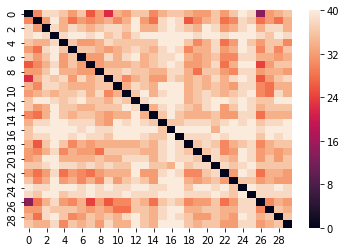

In [19]:
sns.heatmap(list_of_symetric_differences[1])

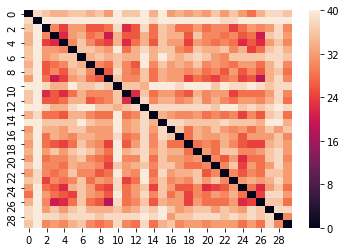

In [20]:
sns.heatmap(list_of_symetric_differences[2])

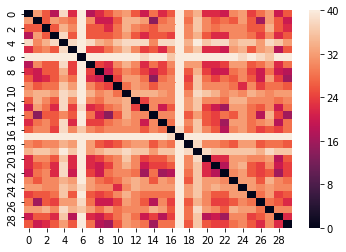

In [21]:
sns.heatmap(list_of_symetric_differences[3])

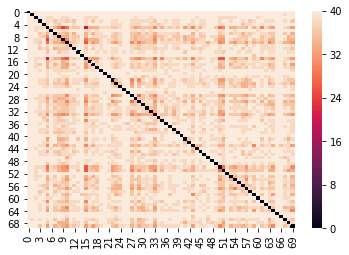

In [23]:
sns.heatmap(list_of_symetric_differences[4],linewidths=.0)

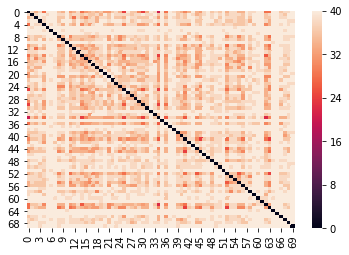

In [35]:
sns.heatmap(list_of_symetric_differences[5],linewidths=.0)

### Diferencia simétrica ponderada

In [ ]:
def get_symetric_difference(list_of_set_per_topic_per_model):
    a_list_of_matrices = []
    for a_model in list_of_set_per_topic_per_model:
        a_matrix = np.zeros((len(a_model),len(a_model)))
        for i,a_topic in enumerate(a_model):
            for j,another_topic in enumerate(a_model):
                a_matrix[i,j] = len(a_topic.symmetric_difference(another_topic))
        a_list_of_matrices.append(a_matrix)
    return a_list_of_matrices

### Para calcular la diferencia simetrica necesito:
-   vectores oredenados del peso de las palabras, lo mismo para kl





In [18]:
import seaborn as sns

In [15]:
np.triu([[1,2,3],[4,5,6],[7,8,9]],1)

array([[0, 2, 3],
       [0, 0, 6],
       [0, 0, 0]])

### kl 

In [16]:
a_list_of_matrices = []
a_list_of_indicators = []
for i,a_model  in enumerate(ldamodels):
    for j,another_model in enumerate(ldamodels):
        mdiff, _ = a_model.diff(another_model)
        a_list_of_matrices.append(mdiff)
#        a_list_of_indicators.append(sum(triu)+sum(tril))

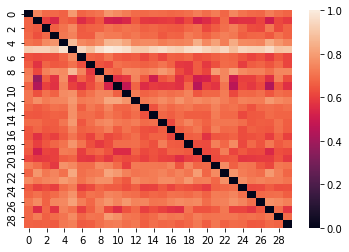

In [19]:
sns.heatmap(a_list_of_matrices[0])

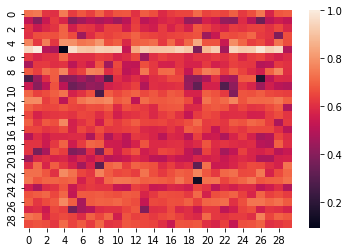

In [20]:
sns.heatmap(a_list_of_matrices[1])

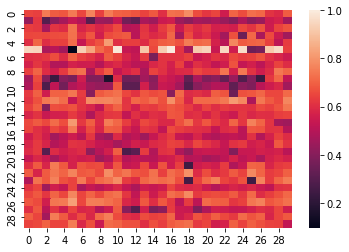

In [21]:
sns.heatmap(a_list_of_matrices[2])

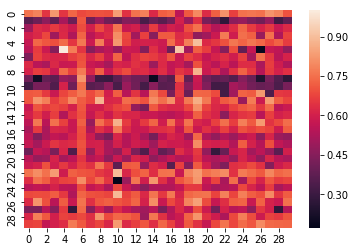

In [22]:
sns.heatmap(a_list_of_matrices[3])

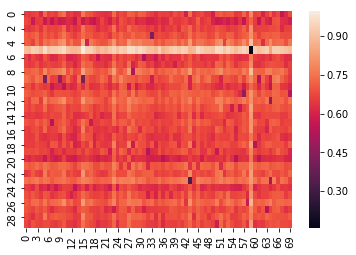

In [23]:
sns.heatmap(a_list_of_matrices[4])

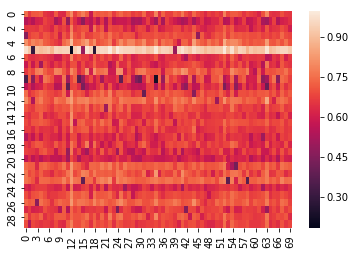

In [24]:
sns.heatmap(a_list_of_matrices[5])

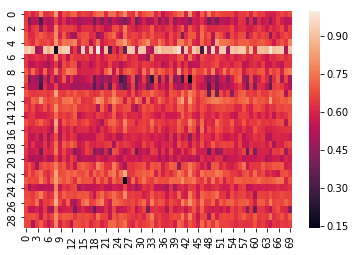

In [25]:
sns.heatmap(a_list_of_matrices[6])

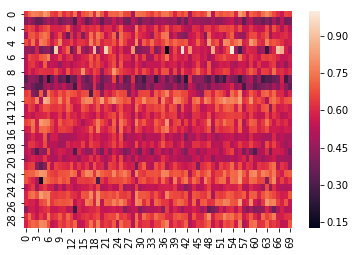

In [26]:
sns.heatmap(a_list_of_matrices[7])

In [29]:
with open('kl_over_topic_models.pickle','wb') as f:
    pickle.dump(a_list_of_matrices,f)

### Cómo describen estos tópicos a los documentotos?

In [27]:
len(a_list_of_matrices)

400